<a href="https://colab.research.google.com/github/Zijan23/Python-for-Geographers-v0.1/blob/main/docs/examples/download_naip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download NAIP Imagery

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/geoai/blob/main/docs/examples/download_naip.ipynb)

## Install package

To use the `geoai-py` package, ensure it is installed in your environment. Uncomment the command below if needed.

In [1]:
 %pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 186.1/186.1 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.0/93.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.7/585.7 kB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 83.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.3/605.3 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2

## Import library

In [1]:
import geoai

In [2]:
import leafmap
from geoai.download import (
    download_naip,
    download_overture_buildings,
    extract_building_stats,
)

## Create an interactive map

In [3]:
m = geoai.Map(center=[47.031260, -99.156360], zoom=14)
m.add_basemap("Esri.WorldImagery")
m

Map(center=[47.03126, -99.15636], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

Use the drawing tool to select an area of interest (AOI) on the map. The selected area will be used to search for NAIP imagery.

In [4]:
if m.user_roi is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-99.1705, 47.0149, -99.1296, 47.0365]

## Search for NAIP imagery

In [5]:
items = geoai.pc_stac_search(
    collection="naip",
    bbox=bbox,
)

Found 6 items matching search criteria


In [6]:
items

[<Item id=ca_m_3712206_nw_10_060_20220518>,
 <Item id=ca_m_3712206_nw_10_060_20200524>,
 <Item id=ca_m_3712206_nw_10_060_20180723_20190209>,
 <Item id=ca_m_3712206_nw_10_.6_20160531_20161004>,
 <Item id=ca_m_3712206_nw_10_1_20140608_20141007>,
 <Item id=ca_m_3712206_nw_10_1_20120520_20120730>]

## Visualize the search results

In [7]:
items = geoai.pc_stac_search(
    collection="naip",
    bbox=bbox,  # Baltimore area
    time_range="2022-01-01/2022-12-31",
)

Found 1 items matching search criteria


In [8]:
items

[<Item id=ca_m_3712206_nw_10_060_20220518>]

In [10]:
# Download NAIP imagery for the specified region
downloaded_files = download_naip(
    bbox=bbox,
    output_dir="naip_data",
    max_items=1,
    year=2022,
)

print(f"Downloaded {len(downloaded_files)} files.")

Found 1 NAIP items.


m_3712206_nw_10_060_20220518.tif: 100%|██████████| 399M/399M [00:08<00:00, 49.0MiB/s]

Successfully saved to naip_data/m_3712206_nw_10_060_20220518.tif
Downloaded 1 files.


## Download NAIP imagery

In [11]:
# Download buildings
data_file = download_overture_buildings(
    bbox=bbox,
    output="buildings.geojson",
)

In [12]:
stats = extract_building_stats(data_file)
print(stats)

{'total_buildings': 548, 'has_height': 421, 'has_name': 0, 'bbox': [-122.3503863, 37.9682441, -122.343067, 37.9738194]}


In [13]:
m = leafmap.Map()
m.add_raster("/content/naip_data/m_3712206_nw_10_060_20220518.tif", layer_name="NAIP")
m.add_geojson("buildings.geojson", layer_name="Buildings")
m

Map(center=[37.9687645, -122.34372049999999], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [14]:
bbox

[-122.3501, 37.9687, -122.3433, 37.9736]

In [16]:
raster_path="/content/naip_data/m_3712206_nw_10_060_20220518.tif"

In [21]:
clip_raster_path = "naip_clip.tif"
geoai.clip_raster_by_bbox(
    raster_path,
    clip_raster_path,
    bbox=(-122.3501, 37.9687, -122.3433, 37.9736),
    bands=[1, 2, 3],
    bbox_type="geo",
    bbox_crs="EPSG:4326",
)

'naip_clip.tif'

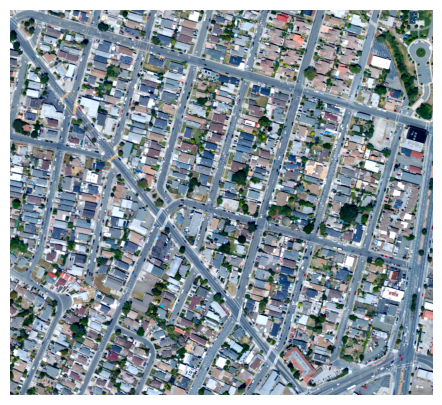

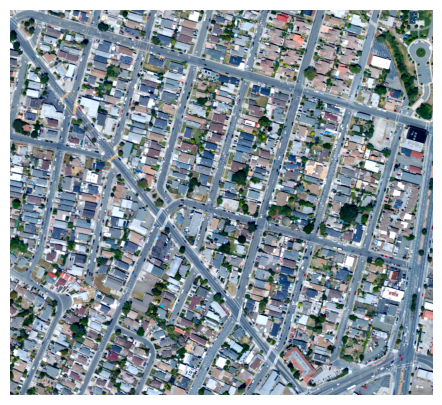

In [22]:
geoai.view_image(clip_raster_path)

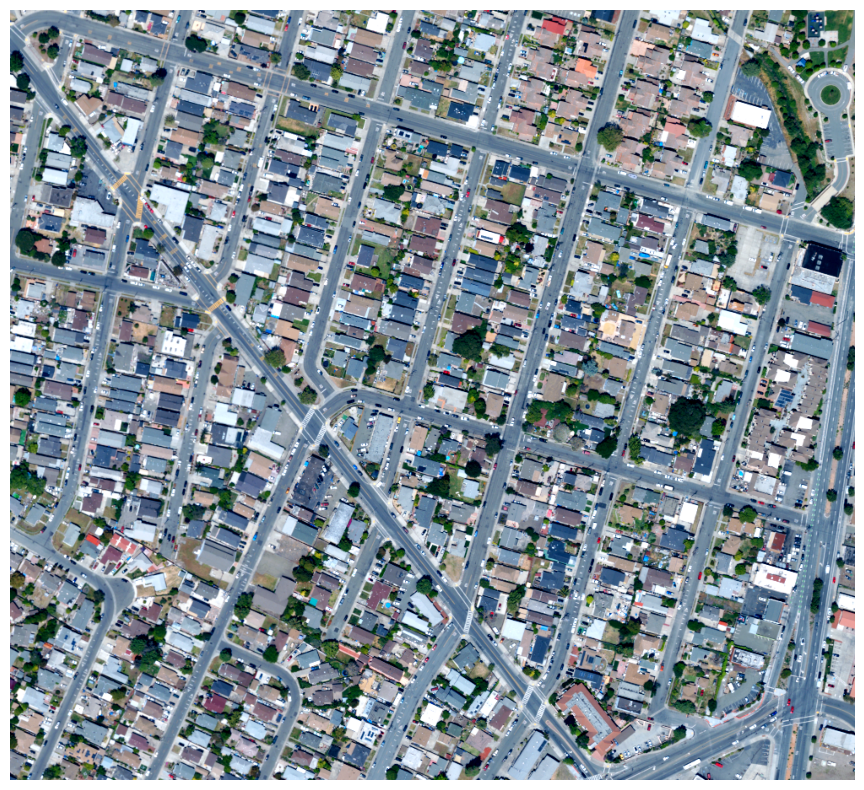

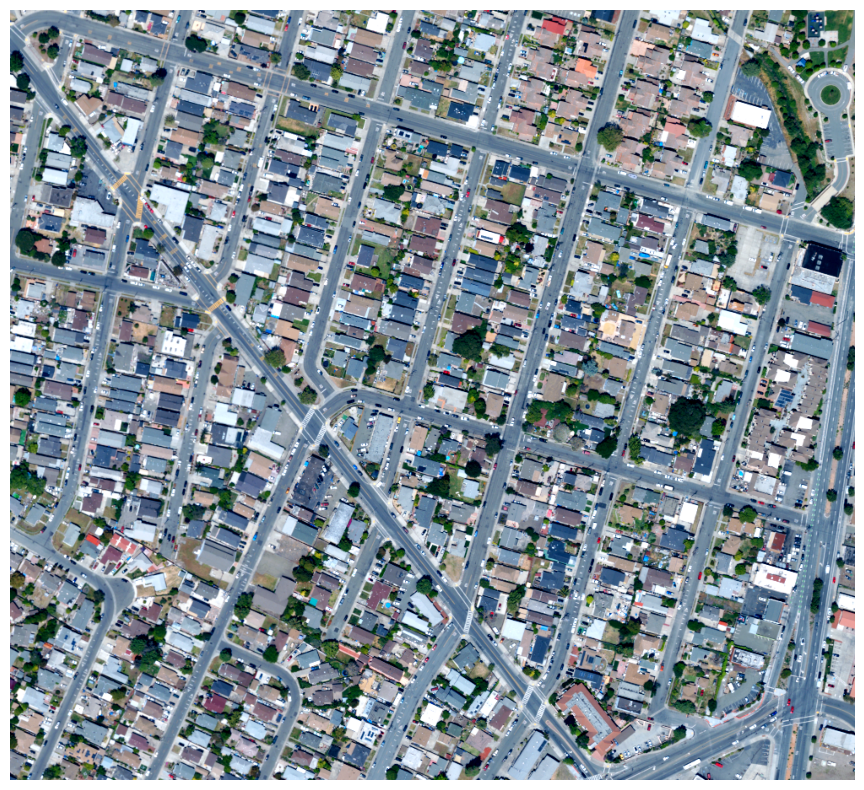

In [23]:
geoai.view_image(clip_raster_path, figsize=(18, 10))